# COMP3029 – Robust Quality Classification of Germinated Oil Palm Seeds
**Under Real-World Distribution Shift**

**Structure:**
1. Setup & Imports
2. Data Loading & Transforms
3. Baseline Model (ResNet18)
4. Baseline Evaluation (Batch-1/2/3)
5. Systematic Error Analysis + Grad-CAM
6. Hypothesis Formulation
7. Hypothesis-Driven Improvement
8. Controlled Experimental Validation
9. Discussion & Reflection

---
## 1. Setup & Imports

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import copy
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from glob import glob
from collections import defaultdict

from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import datasets, transforms, models

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
    classification_report
)
import seaborn as sns

print("All imports OK")

All imports OK


In [ ]:
# ── Reproducibility ──────────────────────────────────────────────────────────
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cpu


In [ ]:
# ── Paths & Config ────────────────────────────────────────────────────────────
ROOT_DIR        = "/content/drive/MyDrive/ComputerVision"

# Batch-1: pre-cropped ImageFolder structure (train/test/BadSeed/GoodSeed)
BATCH1_DIR      = os.path.join(ROOT_DIR, "seedsegment")
BATCH1_TRAIN    = os.path.join(BATCH1_DIR, "train")
BATCH1_TEST     = os.path.join(BATCH1_DIR, "test")

# Batch-2: raw scene images + XML annotations inside each Set subfolder
BATCH2_IMG_DIR  = os.path.join(ROOT_DIR, "NormalRoomLighting")
BATCH2_CSV      = os.path.join(ROOT_DIR, "NormalRoomLight_annotation.csv")

# Batch-3: raw scene images + XML annotations inside each Set subfolder
BATCH3_IMG_DIR  = os.path.join(ROOT_DIR, "LightBox")
BATCH3_CSV      = os.path.join(ROOT_DIR, "LightBox_annotation.csv")

# XML files live alongside the .jpg images inside each Set* subfolder
# e.g. NormalRoomLighting/Set9/Line_Good_Seeds (s9).xml
# We scan recursively — no separate annotations folder needed.
BATCH2_XML_ROOT = BATCH2_IMG_DIR
BATCH3_XML_ROOT = BATCH3_IMG_DIR

IMG_SIZE        = 224
BATCH_SIZE      = 32
NUM_EPOCHS      = 15
LR              = 1e-4
WEIGHT_DECAY    = 1e-4
VAL_SPLIT       = 0.2
NUM_WORKERS     = 2

# CSV path prefix fix
OLD_PREFIX      = "/content/drive/My Drive/AAR/dataset"
ROOT_REPLACE    = (OLD_PREFIX, ROOT_DIR)

BASELINE_SAVE   = "/content/baseline_resnet18_best.pth"
IMPROVED_SAVE   = "/content/improved_model_best.pth"

# Sanity check
for name, p in [("Batch-1 (seedsegment)", BATCH1_DIR),
                ("Batch-2 (NormalRoomLighting)", BATCH2_IMG_DIR),
                ("Batch-2 CSV",    BATCH2_CSV),
                ("Batch-3 (LightBox)", BATCH3_IMG_DIR),
                ("Batch-3 CSV",    BATCH3_CSV)]:
    status = "OK" if os.path.exists(p) else "MISSING – check path"
    print(f"{name}: {status}")


Batch-1 (seedsegment): OK
Batch-2 (NormalRoomLighting): OK
Batch-2 CSV: OK
Batch-3 (LightBox): OK
Batch-3 CSV: OK


---
## 2. Data Loading & Transforms

In [ ]:
# ── Standard transforms ───────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

baseline_train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

In [ ]:
# ── Custom Dataset for Batch-2 / Batch-3 (CSV + bounding boxes) ───────────────
class SeedCropDataset(Dataset):
    """
    Loads seeds from a CSV annotation file, crops each seed using its
    bounding box, and maps BAD/GOOD labels to class indices.
    """
    LABEL_MAP = {"BAD": "BadSeed", "GOOD": "GoodSeed"}

    def __init__(self, csv_file, class_names, transform=None, root_replace=None):
        self.df           = pd.read_csv(csv_file).copy()
        self.transform    = transform
        self.root_replace = root_replace
        self.label_to_idx = {k: class_names.index(v) for k, v in self.LABEL_MAP.items()}

    def _fix_path(self, path):
        path = str(path).strip()
        if self.root_replace:
            old, new = self.root_replace
            if path.startswith(old):
                path = new + path[len(old):]
        if os.path.exists(path):
            return path
        base, ext = os.path.splitext(path)
        for candidate in [base + e for e in (".jpg", ".JPG", ".jpeg", ".JPEG", ".png", ".PNG")]:
            if os.path.exists(candidate):
                return candidate
        return path  # will raise a clear error when opened

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        path  = self._fix_path(row["file_name"])
        xmin, ymin = int(row["x_min"]), int(row["y_min"])
        xmax, ymax = int(row["x_max"]), int(row["y_max"])
        label = self.label_to_idx[str(row["bbox_label"]).strip().upper()]

        img = Image.open(path).convert("RGB").crop((xmin, ymin, xmax, ymax))
        if self.transform:
            img = self.transform(img)
        return img, label


# ── Pascal VOC XML parser & Dataset for Batch-1 raw images ────────────────────
def parse_voc_xml(xml_path):
    """
    Parse a Pascal VOC XML annotation file.
    Returns a dict with keys:
      'filename'  : str
      'width'     : int
      'height'    : int
      'objects'   : list of {'label': str, 'bbox': (xmin,ymin,xmax,ymax)}
    """
    tree = ET.parse(xml_path)
    root = tree.getroot()

    filename = root.findtext("filename", default=os.path.basename(xml_path))
    size     = root.find("size")
    width    = int(size.findtext("width",  default=0)) if size is not None else 0
    height   = int(size.findtext("height", default=0)) if size is not None else 0

    objects = []
    for obj in root.findall("object"):
        label = obj.findtext("name", default="unknown").strip()
        bndbox = obj.find("bndbox")
        if bndbox is None:
            continue
        bbox = (
            int(float(bndbox.findtext("xmin", 0))),
            int(float(bndbox.findtext("ymin", 0))),
            int(float(bndbox.findtext("xmax", 0))),
            int(float(bndbox.findtext("ymax", 0))),
        )
        objects.append({"label": label, "bbox": bbox})

    return {"filename": filename, "width": width, "height": height, "objects": objects}


class XMLSeedDataset(Dataset):
    """
    Loads individual seeds from Pascal VOC XML annotations.
    Each item is one seed crop from the raw scene image.
    Also stores metadata (source image path, bbox, xml path) for
    tracing errors back to the original scene.
    """
    # Normalise whatever label strings appear in the XMLs
    LABEL_NORM = {
        "good": "GoodSeed", "goodseed": "GoodSeed", "good_seed": "GoodSeed",
        "bad":  "BadSeed",  "badseed":  "BadSeed",  "bad_seed":  "BadSeed",
    }

    def __init__(self, xml_dir, img_dir, class_names, transform=None):
        """
        Args:
            xml_dir    : folder containing .xml files
            img_dir    : folder containing the corresponding raw images
            class_names: list of class strings (from ImageFolder)
            transform  : torchvision transform
        """
        self.transform    = transform
        self.class_names  = class_names
        self.label_to_idx = {c: i for i, c in enumerate(class_names)}
        self.records      = []  # one entry per individual seed

        xml_files = sorted(glob(os.path.join(xml_dir, "**", "*.xml"), recursive=True))
        if not xml_files:
            xml_files = sorted(glob(os.path.join(xml_dir, "*.xml")))

        skipped = 0
        for xml_path in xml_files:
            ann = parse_voc_xml(xml_path)

            # Try to locate the source image
            img_path = os.path.join(img_dir, ann["filename"])
            if not os.path.exists(img_path):
                # Try sibling to the XML
                img_path = os.path.join(os.path.dirname(xml_path), ann["filename"])
            if not os.path.exists(img_path):
                skipped += 1
                continue

            for obj in ann["objects"]:
                norm = self.LABEL_NORM.get(obj["label"].lower().replace(" ", ""))
                if norm is None or norm not in self.label_to_idx:
                    continue
                self.records.append({
                    "img_path": img_path,
                    "xml_path": xml_path,
                    "bbox":     obj["bbox"],   # (xmin, ymin, xmax, ymax)
                    "label":    norm,
                    "label_idx": self.label_to_idx[norm],
                })

        print(f"XMLSeedDataset: {len(self.records)} seeds from {len(xml_files)-skipped} XMLs "
              f"({skipped} XMLs skipped – image not found)")

    def __len__(self):
        return len(self.records)

    def __getitem__(self, idx):
        r = self.records[idx]
        xmin, ymin, xmax, ymax = r["bbox"]
        img = Image.open(r["img_path"]).convert("RGB").crop((xmin, ymin, xmax, ymax))
        if self.transform:
            img = self.transform(img)
        return img, r["label_idx"]

In [ ]:
# ── Load Batch-1 ──────────────────────────────────────────────────────────────
train_full = datasets.ImageFolder(BATCH1_TRAIN, transform=baseline_train_transform)
class_names = train_full.classes
num_classes = len(class_names)
print("Classes:", class_names)

val_size   = int(len(train_full) * VAL_SPLIT)
train_size = len(train_full) - val_size

train_ds, val_ds = random_split(
    train_full, [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

# Apply eval transform to validation split
val_ds.dataset = copy.deepcopy(train_full)
val_ds.dataset.transform = eval_transform
train_ds.dataset.transform = baseline_train_transform

batch1_test_ds = datasets.ImageFolder(BATCH1_TEST, transform=eval_transform)

print(f"Train: {len(train_ds)}  Val: {len(val_ds)}  Batch-1 test: {len(batch1_test_ds)}")

Classes: ['BadSeed', 'GoodSeed']
Train: 1402  Val: 350  Batch-1 test: 401


### 2a. XML Annotation Exploration (Batch-1 Raw Data)

The `seedsplit` folder contains raw scene images alongside Pascal VOC XML annotations.
Each XML describes the positions and quality labels of all seeds in one photo.
We use these to:
- Verify the dataset composition and label distribution
- Build a bounding-box-aware dataset from the raw images (alternative to ImageFolder)
- Visualise seeds *in context* of the full scene for richer error analysis

In [ ]:
# ── Explore XML files in Batch-2 and Batch-3 Set folders ─────────────────────
# XMLs sit alongside .jpg images inside NormalRoomLighting/Set*/  and  LightBox/Set*/

def explore_xml_dir(xml_root, label, max_show=2):
    """Recursively find and audit all XML annotation files under xml_root."""
    xml_files = sorted(glob(os.path.join(xml_root, "**", "*.xml"), recursive=True))

    if not xml_files:
        print(f"[{label}] No XML files found under {xml_root}")
        print("  Contents:", os.listdir(xml_root)[:10] if os.path.exists(xml_root) else "MISSING")
        return []

    print(f"[{label}] Found {len(xml_files)} XML files")
    for p in xml_files[:3]:
        print(" ", p)

    from collections import defaultdict
    label_counts  = defaultdict(int)
    bbox_sizes    = []
    seeds_per_img = []

    for xf in xml_files:
        ann = parse_voc_xml(xf)
        seeds_per_img.append(len(ann["objects"]))
        for obj in ann["objects"]:
            label_counts[obj["label"]] += 1
            xmin, ymin, xmax, ymax = obj["bbox"]
            bbox_sizes.append((xmax - xmin, ymax - ymin))

    print(f"  Label distribution:")
    for lbl, cnt in sorted(label_counts.items(), key=lambda x: -x[1]):
        print(f"    {lbl}: {cnt}")

    if bbox_sizes:
        ws, hs = zip(*bbox_sizes)
        print(f"  BBox W: min={min(ws)} max={max(ws)} mean={sum(ws)/len(ws):.1f}")
        print(f"  BBox H: min={min(hs)} max={max(hs)} mean={sum(hs)/len(hs):.1f}")

    print(f"  Seeds/image: min={min(seeds_per_img)} max={max(seeds_per_img)} "
          f"mean={sum(seeds_per_img)/len(seeds_per_img):.1f}")

    print(f"\n  Sample annotations:")
    for xf in xml_files[:max_show]:
        ann = parse_voc_xml(xf)
        print(f"    {ann['filename']}  ({ann['width']}x{ann['height']})  "
              f"{len(ann['objects'])} objects")
        for obj in ann["objects"][:3]:
            print(f"      [{obj['label']}]  bbox={obj['bbox']}")
    return xml_files


b2_xml_files = explore_xml_dir(BATCH2_XML_ROOT, "Batch-2 NormalRoomLighting")
print()
b3_xml_files = explore_xml_dir(BATCH3_XML_ROOT, "Batch-3 LightBox")


[Batch-2 NormalRoomLighting] Found 90 XML files
  /content/drive/MyDrive/ComputerVision/NormalRoomLighting/Set1/Line_Bad_Seeds (s1).xml
  /content/drive/MyDrive/ComputerVision/NormalRoomLighting/Set1/Line_Good_Seeds (s1).xml
  /content/drive/MyDrive/ComputerVision/NormalRoomLighting/Set1/Line_Mix (s1).xml
  Label distribution:
    Bad Seed: 450
    Good Seed: 450
  BBox W: min=290 max=1015 mean=404.0
  BBox H: min=274 max=1183 mean=452.9
  Seeds/image: min=10 max=10 mean=10.0

  Sample annotations:
    Line_Bad_Seeds (s1).JPG  (5175x3201)  10 objects
      [Bad Seed]  bbox=(221, 1517, 595, 2135)
      [Bad Seed]  bbox=(672, 1639, 1053, 2158)
      [Bad Seed]  bbox=(1252, 1601, 1565, 2135)
    Line_Good_Seeds (s1).JPG  (5175x3201)  10 objects
      [Good Seed]  bbox=(282, 990, 679, 1776)
      [Good Seed]  bbox=(771, 1043, 1175, 1822)
      [Good Seed]  bbox=(1252, 1097, 1603, 1692)

[Batch-3 LightBox] Found 120 XML files
  /content/drive/MyDrive/ComputerVision/LightBox/Set1/Line_BadSee

── Batch-2 (NormalRoomLighting) ──


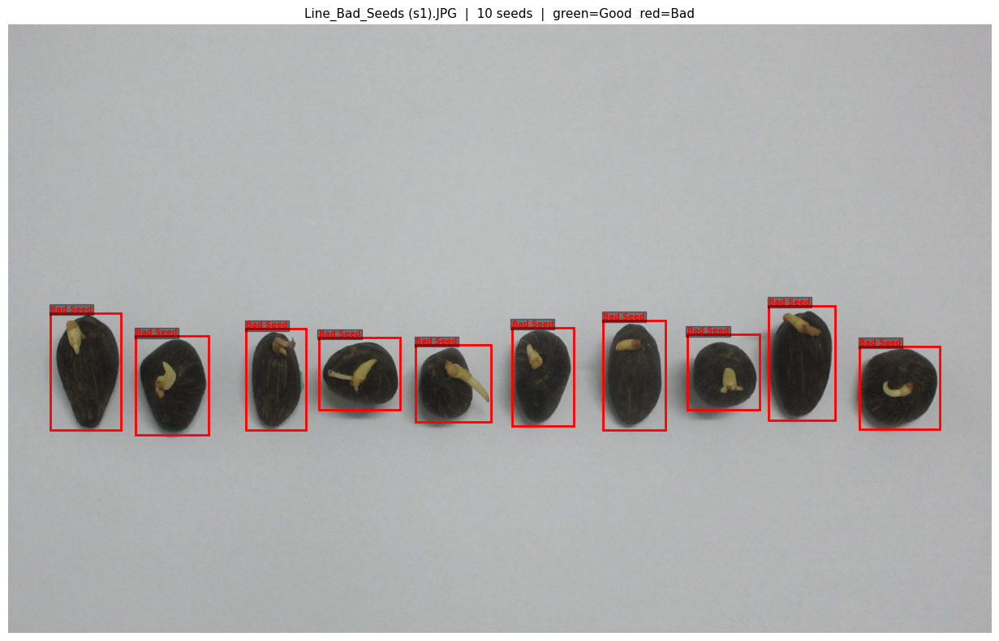

── Batch-3 (LightBox) ──


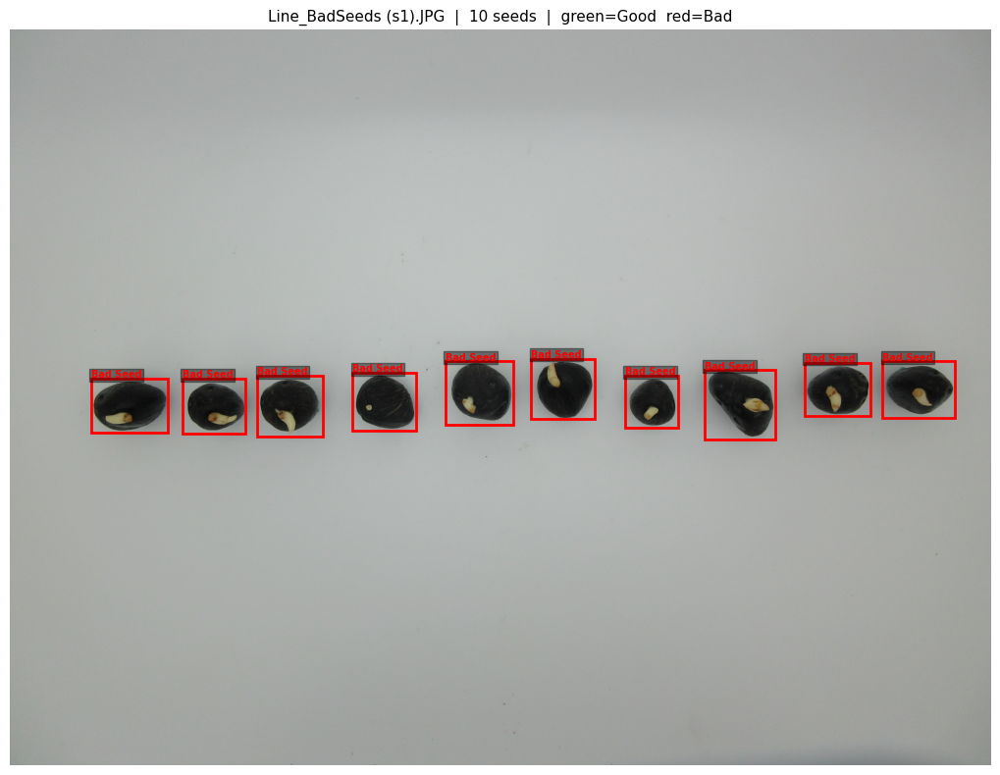

In [ ]:
# ── Visualise annotated scene: bounding boxes on raw image ───────────────────
# Good seeds = green boxes, Bad seeds = red boxes.

def visualise_annotations(xml_path, max_seeds=None):
    """
    Draw bounding boxes from an XML file on its corresponding scene image.
    The image is assumed to live in the same folder as the XML.
    """
    ann = parse_voc_xml(xml_path)
    img_path = os.path.join(os.path.dirname(xml_path), ann["filename"])

    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        return

    img = Image.open(img_path).convert("RGB")
    fig, ax = plt.subplots(1, 1, figsize=(14, 8))
    ax.imshow(img)

    COLOR_MAP = {"good": "lime", "goodseed": "lime", "good_seed": "lime",
                 "bad":  "red",  "badseed":  "red",  "bad_seed":  "red"}

    objs = ann["objects"] if max_seeds is None else ann["objects"][:max_seeds]
    for obj in objs:
        xmin, ymin, xmax, ymax = obj["bbox"]
        color = COLOR_MAP.get(obj["label"].lower().replace(" ", ""), "yellow")
        rect = patches.Rectangle(
            (xmin, ymin), xmax - xmin, ymax - ymin,
            linewidth=2, edgecolor=color, facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(xmin, ymin - 4, obj["label"], color=color,
                fontsize=7, fontweight="bold",
                bbox=dict(facecolor="black", alpha=0.4, pad=1))

    ax.set_title(f"{ann['filename']}  |  {len(objs)} seeds  |  green=Good  red=Bad",
                 fontsize=11)
    ax.axis("off")
    plt.tight_layout()
    plt.show()


# Show one scene from each batch
if b2_xml_files:
    print("── Batch-2 (NormalRoomLighting) ──")
    visualise_annotations(b2_xml_files[0])
if b3_xml_files:
    print("── Batch-3 (LightBox) ──")
    visualise_annotations(b3_xml_files[0])


In [ ]:
# ── Build XMLSeedDatasets for Batch-2 and Batch-3 ────────────────────────────
# Image and XML are in the same Set* subfolder, so img_dir = xml_dir = the Set folder.
# XMLSeedDataset handles this: it looks for the image as a sibling to the XML file.

b2_xml_ds = XMLSeedDataset(
    xml_dir     = BATCH2_XML_ROOT,
    img_dir     = BATCH2_IMG_DIR,   # sibling fallback also checked
    class_names = class_names,
    transform   = eval_transform
) if b2_xml_files else None

b3_xml_ds = XMLSeedDataset(
    xml_dir     = BATCH3_XML_ROOT,
    img_dir     = BATCH3_IMG_DIR,
    class_names = class_names,
    transform   = eval_transform
) if b3_xml_files else None

print(f"Batch-2 XML dataset: {len(b2_xml_ds) if b2_xml_ds else 'N/A'} seeds")
print(f"Batch-3 XML dataset: {len(b3_xml_ds) if b3_xml_ds else 'N/A'} seeds")
print()
print("Note: if counts differ from the CSV loaders, it means some XML labels")
print("use different strings — check XMLSeedDataset.LABEL_NORM for coverage.")


XMLSeedDataset: 900 seeds from 90 XMLs (0 XMLs skipped – image not found)
XMLSeedDataset: 1198 seeds from 120 XMLs (0 XMLs skipped – image not found)
Batch-2 XML dataset: 900 seeds
Batch-3 XML dataset: 1198 seeds

Note: if counts differ from the CSV loaders, it means some XML labels
use different strings — check XMLSeedDataset.LABEL_NORM for coverage.


Dataset composition:
  Batch-1 train: {'GoodSeed': 901, 'BadSeed': 851}  total=1752
  Batch-1 test : {'GoodSeed': 201, 'BadSeed': 200}   total=401
  Batch-2      : {'GOOD': 450, 'BAD': 450}  total=900
  Batch-3      : {'GOOD': 605, 'BAD': 593}  total=1198


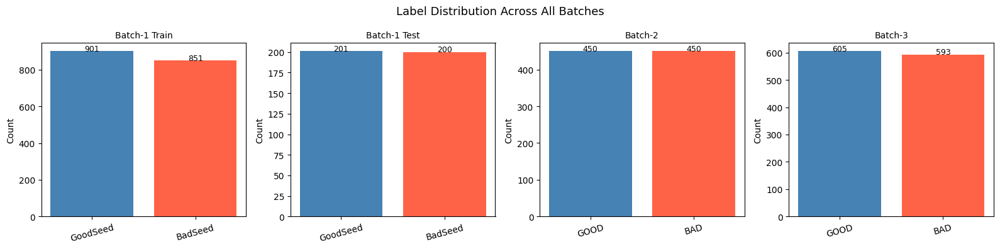

In [ ]:
# ── Dataset statistics across all three batches ───────────────────────────────
def count_labels_imagefolder(folder):
    counts = {}
    for cls in os.listdir(folder):
        cls_path = os.path.join(folder, cls)
        if os.path.isdir(cls_path):
            counts[cls] = len([
                f for f in os.listdir(cls_path)
                if f.lower().endswith((".jpg", ".jpeg", ".png"))
            ])
    return counts

b1_train_counts = count_labels_imagefolder(BATCH1_TRAIN)
b1_test_counts  = count_labels_imagefolder(BATCH1_TEST)

b2_df = pd.read_csv(BATCH2_CSV)
b3_df = pd.read_csv(BATCH3_CSV)
b2_counts = b2_df["bbox_label"].value_counts().to_dict()
b3_counts = b3_df["bbox_label"].value_counts().to_dict()

print("Dataset composition:")
print(f"  Batch-1 train: {b1_train_counts}  total={sum(b1_train_counts.values())}")
print(f"  Batch-1 test : {b1_test_counts}   total={sum(b1_test_counts.values())}")
print(f"  Batch-2      : {b2_counts}  total={sum(b2_counts.values())}")
print(f"  Batch-3      : {b3_counts}  total={sum(b3_counts.values())}")

# Visual summary bar chart
fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=False)
for ax, (title, counts) in zip(axes, [
    ("Batch-1 Train", b1_train_counts),
    ("Batch-1 Test",  b1_test_counts),
    ("Batch-2",       b2_counts),
    ("Batch-3",       b3_counts),
]):
    labels_ = list(counts.keys())
    values_ = list(counts.values())
    colors_ = ["tomato" if "bad" in k.lower() else "steelblue" for k in labels_]
    ax.bar(labels_, values_, color=colors_)
    ax.set_title(title, fontsize=10)
    ax.set_ylabel("Count")
    for j, v in enumerate(values_):
        ax.text(j, v + 0.5, str(v), ha="center", fontsize=9)
    ax.tick_params(axis="x", labelrotation=15)
plt.suptitle("Label Distribution Across All Batches", fontsize=13)
plt.tight_layout()
plt.show()

In [ ]:
# ── Load Batch-2 and Batch-3 ──────────────────────────────────────────────────
batch2_ds = SeedCropDataset(BATCH2_CSV, class_names, eval_transform, ROOT_REPLACE)
batch3_ds = SeedCropDataset(BATCH3_CSV, class_names, eval_transform, ROOT_REPLACE)

print(f"Batch-2: {len(batch2_ds)} samples")
print(f"Batch-3: {len(batch3_ds)} samples")

Batch-2: 900 samples
Batch-3: 1198 samples


In [ ]:
# ── DataLoaders ───────────────────────────────────────────────────────────────
def make_loader(ds, shuffle=False, bs=BATCH_SIZE, nw=NUM_WORKERS):
    return DataLoader(ds, batch_size=bs, shuffle=shuffle,
                      num_workers=nw, pin_memory=True)

train_loader  = make_loader(train_ds,      shuffle=True)
val_loader    = make_loader(val_ds)
b1_test_loader = make_loader(batch1_test_ds)
b2_loader     = make_loader(batch2_ds)
b3_loader     = make_loader(batch3_ds)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


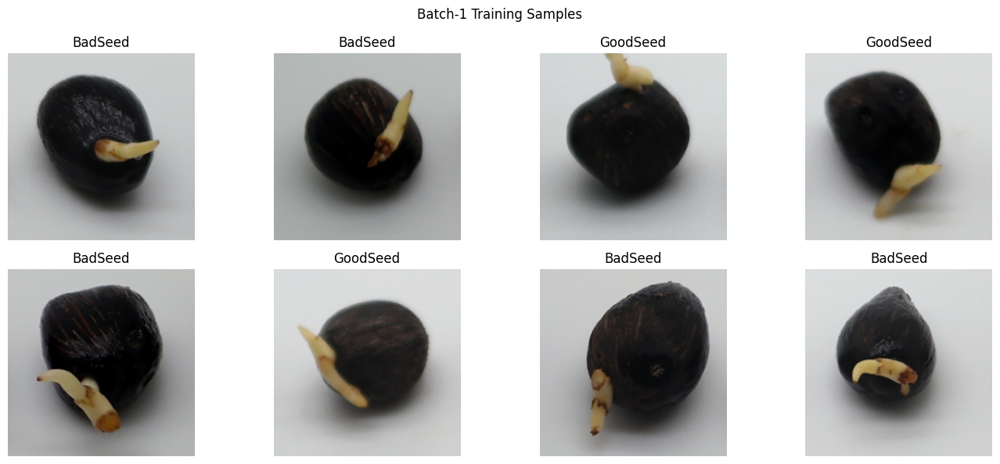

In [ ]:
# ── Quick visual sanity check ─────────────────────────────────────────────────
def denorm(tensor):
    img = tensor.numpy().transpose(1, 2, 0)
    img = np.array(IMAGENET_STD) * img + np.array(IMAGENET_MEAN)
    return np.clip(img, 0, 1)

images, labels = next(iter(make_loader(train_ds, shuffle=True, bs=8)))
fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for ax, img, lbl in zip(axes.flat, images, labels):
    ax.imshow(denorm(img))
    ax.set_title(class_names[lbl])
    ax.axis("off")
plt.suptitle("Batch-1 Training Samples")
plt.tight_layout()
plt.show()

---
## 3. Baseline Model – ResNet18

**Justification:** ResNet18 is a lightweight, well-understood CNN pretrained on ImageNet. Its skip connections mitigate vanishing gradients, and the model is small enough to train quickly on Colab while being expressive enough for binary seed classification. This serves as a strong, reproducible baseline to expose distribution shift effects.

In [ ]:
# ── Shared train / validate functions ─────────────────────────────────────────
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss, all_preds, all_labels = 0.0, [], []
    for imgs, lbls in tqdm(loader, desc="Train", leave=False):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        loss = criterion(model(imgs), lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * imgs.size(0)
        all_preds.extend(model(imgs).argmax(1).detach().cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())
    return running_loss / len(loader.dataset), accuracy_score(all_labels, all_preds)


@torch.no_grad()
def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss, all_preds, all_labels = 0.0, [], []
    for imgs, lbls in tqdm(loader, desc="Val", leave=False):
        imgs, lbls = imgs.to(device), lbls.to(device)
        out = model(imgs)
        running_loss += criterion(out, lbls).item() * imgs.size(0)
        all_preds.extend(out.argmax(1).cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())
    return running_loss / len(loader.dataset), accuracy_score(all_labels, all_preds)


def run_training(model, train_loader, val_loader, criterion, optimizer,
                 scheduler, n_epochs, save_path, tag="Model"):
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}
    best_val_acc = 0.0
    for epoch in range(n_epochs):
        tl, ta = train_one_epoch(model, train_loader, criterion, optimizer, device)
        vl, va = validate_one_epoch(model, val_loader, criterion, device)
        if scheduler: scheduler.step(va)
        history["train_loss"].append(tl); history["train_acc"].append(ta)
        history["val_loss"].append(vl);   history["val_acc"].append(va)
        print(f"[{tag}] E{epoch+1:02d}/{n_epochs}  "
              f"train_loss={tl:.4f} acc={ta:.4f}  "
              f"val_loss={vl:.4f} acc={va:.4f}")
        if va > best_val_acc:
            best_val_acc = va
            torch.save(model.state_dict(), save_path)
            print(f"  ✓ Saved best ({va:.4f})")
    print(f"\nBest val acc: {best_val_acc:.4f}")
    return history

In [ ]:
# ── Build baseline ────────────────────────────────────────────────────────────
def build_resnet18(num_classes):
    m = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    m.fc = nn.Linear(m.fc.in_features, num_classes)
    return m

baseline = build_resnet18(num_classes).to(device)
criterion_base = nn.CrossEntropyLoss()
optimizer_base = optim.Adam(baseline.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler_base = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_base, mode="max", patience=3, factor=0.5
)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 91.9MB/s]


In [ ]:
history_base = run_training(
    baseline, train_loader, val_loader,
    criterion_base, optimizer_base, scheduler_base,
    NUM_EPOCHS, BASELINE_SAVE, tag="Baseline ResNet18"
)

Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E01/15  train_loss=0.2788 acc=0.9608  val_loss=0.1296 acc=0.9486
  ✓ Saved best (0.9486)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E02/15  train_loss=0.0660 acc=0.9914  val_loss=0.1087 acc=0.9543
  ✓ Saved best (0.9543)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E03/15  train_loss=0.0469 acc=0.9964  val_loss=0.0920 acc=0.9600
  ✓ Saved best (0.9600)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E04/15  train_loss=0.0444 acc=0.9957  val_loss=0.0735 acc=0.9743
  ✓ Saved best (0.9743)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E05/15  train_loss=0.0183 acc=0.9993  val_loss=0.1223 acc=0.9657


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E06/15  train_loss=0.0126 acc=1.0000  val_loss=0.0758 acc=0.9714


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E07/15  train_loss=0.0064 acc=1.0000  val_loss=0.0894 acc=0.9686


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E08/15  train_loss=0.0033 acc=1.0000  val_loss=0.0801 acc=0.9743


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E09/15  train_loss=0.0035 acc=1.0000  val_loss=0.0773 acc=0.9714


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E10/15  train_loss=0.0030 acc=1.0000  val_loss=0.0796 acc=0.9714


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E11/15  train_loss=0.0016 acc=1.0000  val_loss=0.0779 acc=0.9657


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E12/15  train_loss=0.0013 acc=1.0000  val_loss=0.0702 acc=0.9714


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E13/15  train_loss=0.0021 acc=1.0000  val_loss=0.0686 acc=0.9743


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Baseline ResNet18] E14/15  train_loss=0.0017 acc=1.0000  val_loss=0.0772 acc=0.9686


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
                                                    

[Baseline ResNet18] E15/15  train_loss=0.0049 acc=1.0000  val_loss=0.0648 acc=0.9714

Best val acc: 0.9743


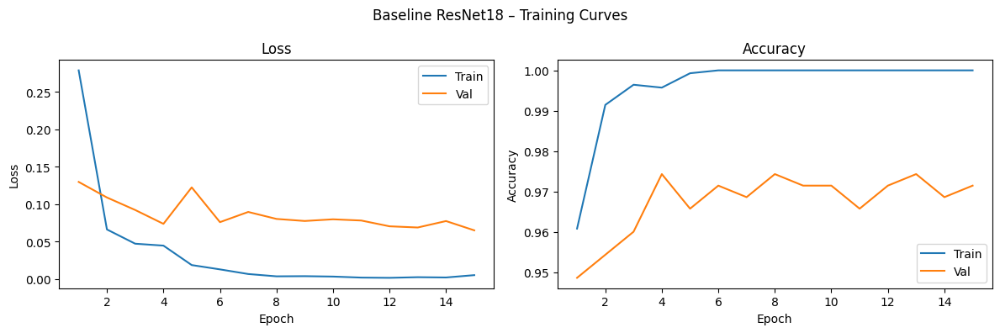

In [ ]:
def plot_history(history, title="Training Curves"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    epochs = range(1, len(history["train_loss"]) + 1)
    ax1.plot(epochs, history["train_loss"], label="Train")
    ax1.plot(epochs, history["val_loss"],   label="Val")
    ax1.set(xlabel="Epoch", ylabel="Loss", title="Loss"); ax1.legend()
    ax2.plot(epochs, history["train_acc"],  label="Train")
    ax2.plot(epochs, history["val_acc"],    label="Val")
    ax2.set(xlabel="Epoch", ylabel="Accuracy", title="Accuracy"); ax2.legend()
    plt.suptitle(title); plt.tight_layout(); plt.show()

plot_history(history_base, "Baseline ResNet18 – Training Curves")

---
## 4. Baseline Evaluation (All Batches)

In [ ]:
@torch.no_grad()
def evaluate_model(model, loader, device):
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    for imgs, lbls in tqdm(loader, desc="Eval", leave=False):
        imgs = imgs.to(device)
        probs = F.softmax(model(imgs), dim=1)
        all_probs.extend(probs.cpu().numpy())
        all_preds.extend(probs.argmax(1).cpu().numpy())
        all_labels.extend(lbls.numpy())
    y_true, y_pred = np.array(all_labels), np.array(all_preds)
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred,
                                                        average="weighted", zero_division=0)
    return {"accuracy": acc, "precision": prec, "recall": rec, "f1": f1,
            "cm": confusion_matrix(y_true, y_pred),
            "y_true": y_true, "y_pred": y_pred, "y_prob": np.array(all_probs)}

In [ ]:
# Load best checkpoint and evaluate
baseline.load_state_dict(torch.load(BASELINE_SAVE, map_location=device))
baseline.eval()

res_b1 = evaluate_model(baseline, b1_test_loader, device)
res_b2 = evaluate_model(baseline, b2_loader, device)
res_b3 = evaluate_model(baseline, b3_loader, device)

Eval:   0%|          | 0/13 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Eval:   0%|          | 0/29 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Eval:   0%|          | 0/38 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


In [ ]:
def print_metrics(name, r):
    print(f"\n{'='*50}\n{name}")
    print(f"  Accuracy : {r['accuracy']:.4f}")
    print(f"  Precision: {r['precision']:.4f}")
    print(f"  Recall   : {r['recall']:.4f}")
    print(f"  F1-score : {r['f1']:.4f}")

print_metrics("Baseline – Batch-1 (in-domain)", res_b1)
print_metrics("Baseline – Batch-2 (lighting shift)", res_b2)
print_metrics("Baseline – Batch-3 (pose shift)", res_b3)


Baseline – Batch-1 (in-domain)
  Accuracy : 0.9651
  Precision: 0.9651
  Recall   : 0.9651
  F1-score : 0.9651

Baseline – Batch-2 (lighting shift)
  Accuracy : 0.8000
  Precision: 0.8169
  Recall   : 0.8000
  F1-score : 0.7973

Baseline – Batch-3 (pose shift)
  Accuracy : 0.8097
  Precision: 0.8246
  Recall   : 0.8097
  F1-score : 0.8072


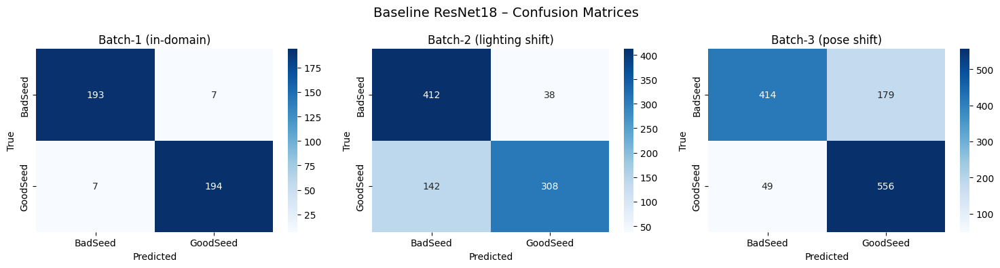

In [ ]:
# ── Confusion matrices ────────────────────────────────────────────────────────
def plot_cm(ax, cm, class_names, title):
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set(xlabel="Predicted", ylabel="True", title=title)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
plot_cm(axes[0], res_b1["cm"], class_names, "Batch-1 (in-domain)")
plot_cm(axes[1], res_b2["cm"], class_names, "Batch-2 (lighting shift)")
plot_cm(axes[2], res_b3["cm"], class_names, "Batch-3 (pose shift)")
plt.suptitle("Baseline ResNet18 – Confusion Matrices", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# ── Cross-domain comparison table ─────────────────────────────────────────────
rows = []
for name, r in [("Batch-1 (in-domain)", res_b1),
                ("Batch-2 (lighting)",  res_b2),
                ("Batch-3 (pose)",      res_b3)]:
    rows.append({"Dataset": name,
                 "Accuracy":  round(r["accuracy"],  4),
                 "Precision": round(r["precision"], 4),
                 "Recall":    round(r["recall"],    4),
                 "F1":        round(r["f1"],        4)})

comparison_df = pd.DataFrame(rows)
print(comparison_df.to_string(index=False))

            Dataset  Accuracy  Precision  Recall     F1
Batch-1 (in-domain)    0.9651     0.9651  0.9651 0.9651
 Batch-2 (lighting)    0.8000     0.8169  0.8000 0.7973
     Batch-3 (pose)    0.8097     0.8246  0.8097 0.8072


In [ ]:
# ── Per-class reports ─────────────────────────────────────────────────────────
for name, r in [("Batch-1", res_b1), ("Batch-2", res_b2), ("Batch-3", res_b3)]:
    print(f"\n── {name} ──")
    print(classification_report(r["y_true"], r["y_pred"],
                                target_names=class_names, zero_division=0))


── Batch-1 ──
              precision    recall  f1-score   support

     BadSeed       0.96      0.96      0.96       200
    GoodSeed       0.97      0.97      0.97       201

    accuracy                           0.97       401
   macro avg       0.97      0.97      0.97       401
weighted avg       0.97      0.97      0.97       401


── Batch-2 ──
              precision    recall  f1-score   support

     BadSeed       0.74      0.92      0.82       450
    GoodSeed       0.89      0.68      0.77       450

    accuracy                           0.80       900
   macro avg       0.82      0.80      0.80       900
weighted avg       0.82      0.80      0.80       900


── Batch-3 ──
              precision    recall  f1-score   support

     BadSeed       0.89      0.70      0.78       593
    GoodSeed       0.76      0.92      0.83       605

    accuracy                           0.81      1198
   macro avg       0.83      0.81      0.81      1198
weighted avg       0.82      

---
## 5. Systematic Error Analysis

This section identifies **failure patterns** through:
1. Visualisation of misclassified samples
2. Grad-CAM saliency maps to reveal where the model attends
3. Confidence distribution of errors

#### Scene-level Error Patterns
By overlaying predictions onto the original multi-seed scene image we can check whether:
- Errors cluster at **image edges** (cropping artefacts)
- Errors cluster on **one class** (class bias)
- Errors occur in **mixed-label rows** (contextual confusion between adjacent seeds)

These observations directly inform our hypothesis.

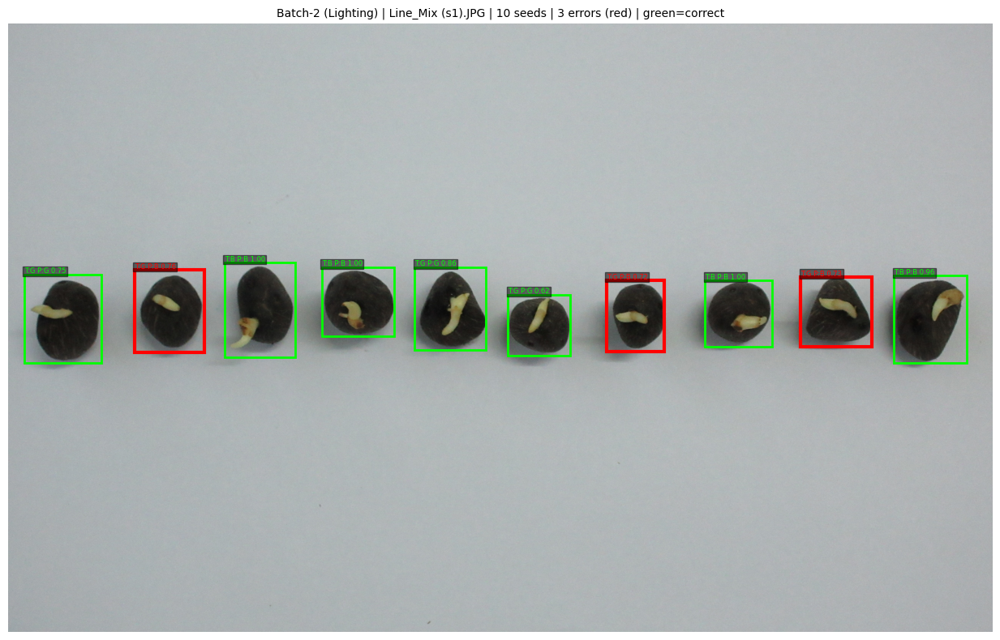

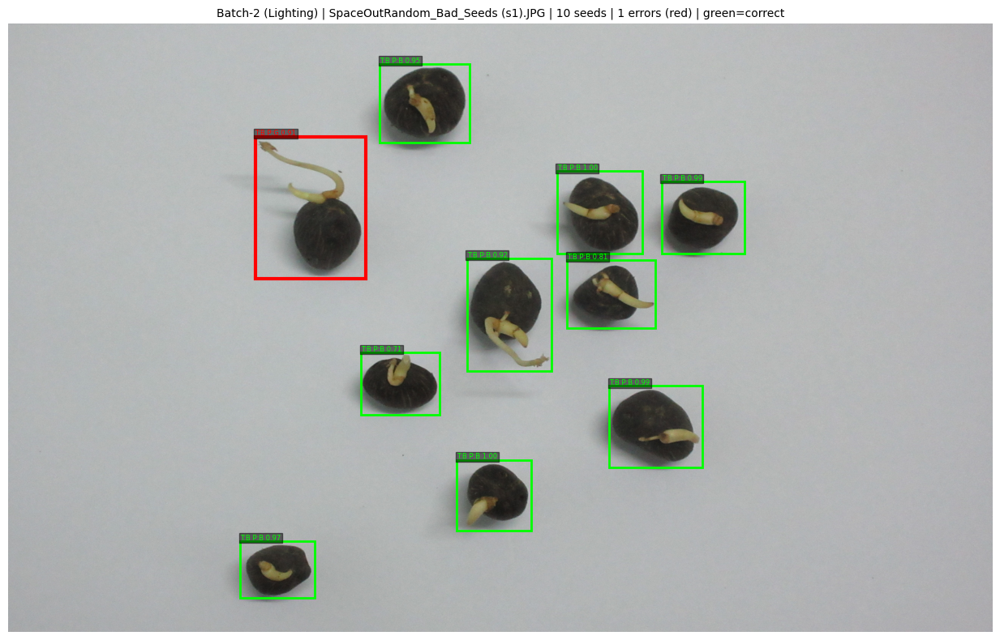

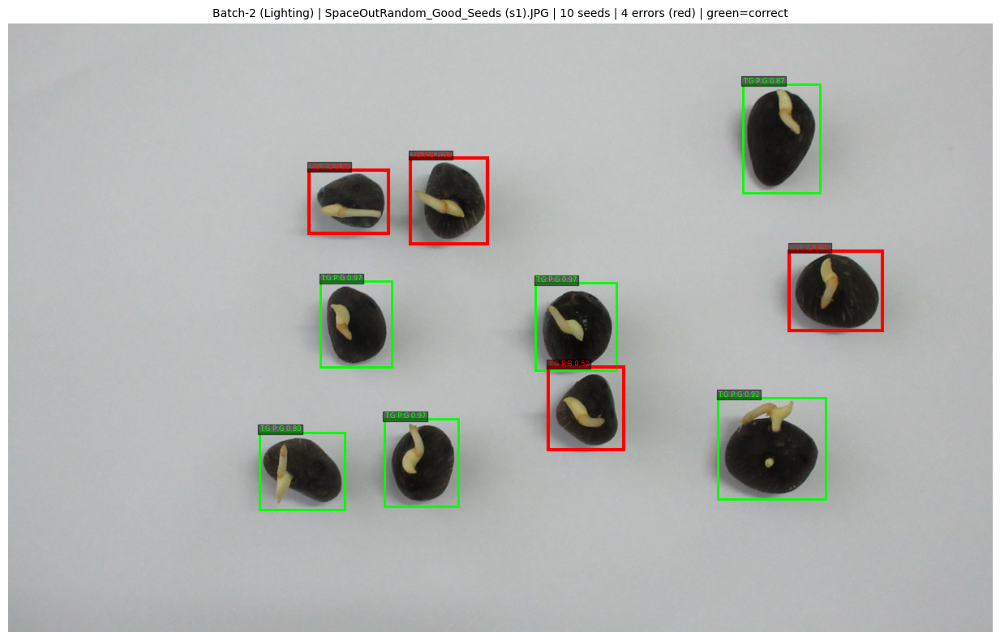

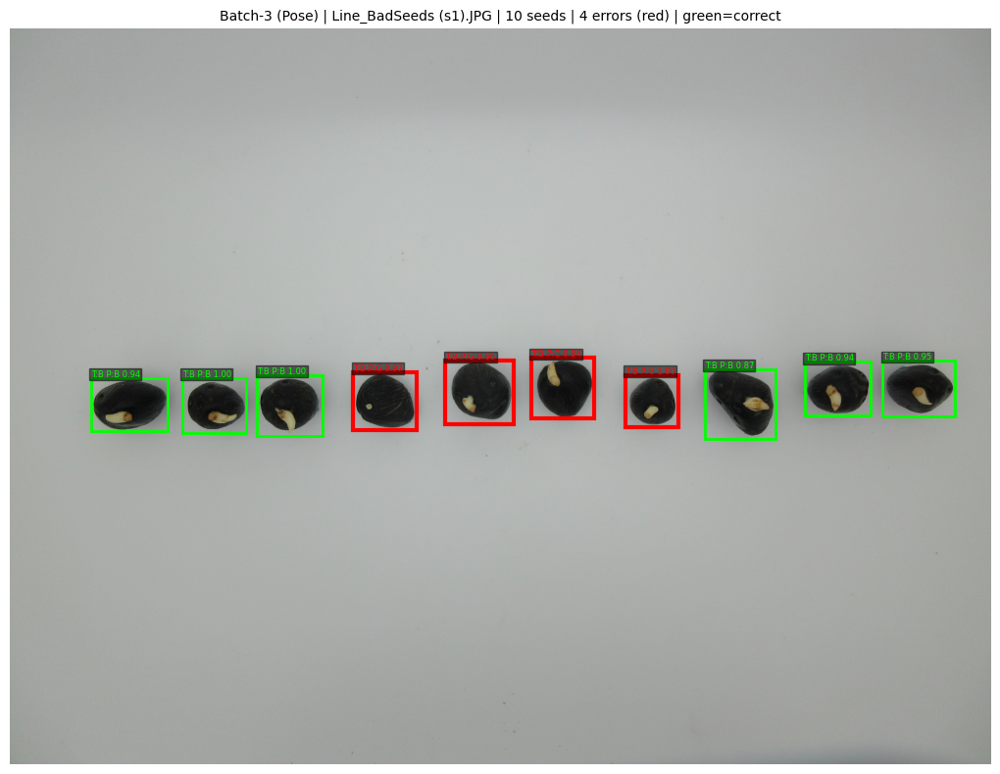

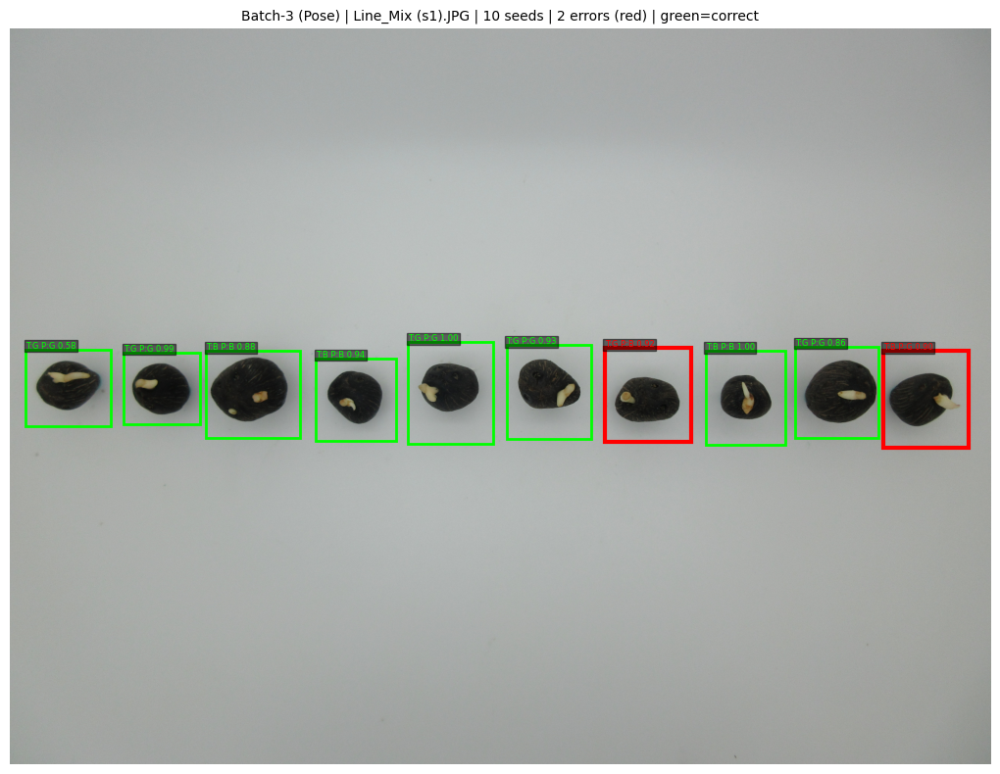

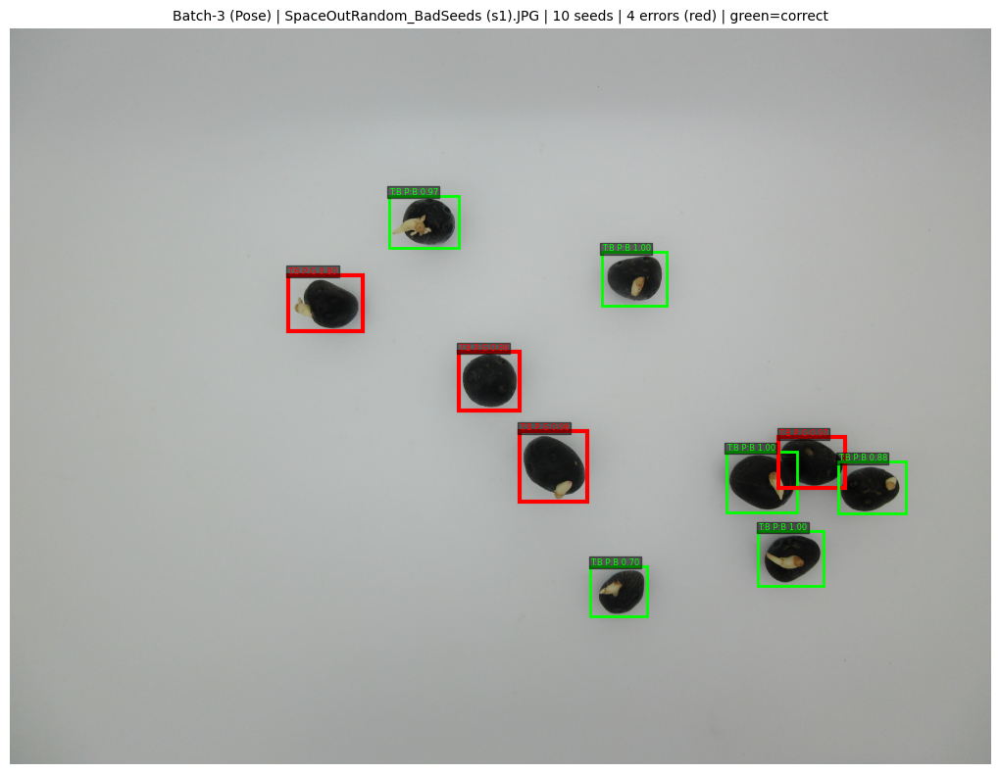

In [ ]:
# ── Scene-level error visualisation using XML bounding boxes ─────────────────
# Runs on Batch-2 and Batch-3: groups seeds by source image, runs the baseline,
# and overlays green (correct) / red (wrong) boxes on the original scene photo.
# This reveals whether errors cluster spatially (edges, mixed rows, etc.)

def visualise_scene_errors(model, xml_ds, batch_label, class_names, device, n_scenes=3):
    if xml_ds is None:
        print(f"No XML dataset for {batch_label} – skipping")
        return

    model.eval()
    by_image = defaultdict(list)
    for idx, rec in enumerate(xml_ds.records):
        by_image[rec["img_path"]].append((idx, rec))

    shown = 0
    for img_path, entries in list(by_image.items()):
        if shown >= n_scenes:
            break

        results = []
        for idx, rec in entries:
            img_t, true_lbl = xml_ds[idx]
            with torch.no_grad():
                prob = torch.softmax(model(img_t.unsqueeze(0).to(device)), dim=1)
                pred = prob.argmax(1).item()
                conf = prob[0, pred].item()
            results.append({"rec": rec, "pred": pred, "conf": conf,
                             "correct": pred == rec["label_idx"]})

        n_errors = sum(1 for r in results if not r["correct"])
        if n_errors == 0:
            continue  # only show scenes that have at least one error

        scene_img = Image.open(img_path).convert("RGB")
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(scene_img)

        for r in results:
            xmin, ymin, xmax, ymax = r["rec"]["bbox"]
            color = "lime" if r["correct"] else "red"
            lw    = 2 if r["correct"] else 3
            rect  = patches.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                linewidth=lw, edgecolor=color, facecolor="none"
            )
            ax.add_patch(rect)
            lstr = (f"T:{r['rec']['label'][0]} "
                    f"P:{class_names[r['pred']][0]} "
                    f"{r['conf']:.2f}")
            ax.text(xmin, ymin - 5, lstr, color=color, fontsize=6,
                    bbox=dict(facecolor="black", alpha=0.5, pad=1))

        ax.set_title(
            f"{batch_label} | {os.path.basename(img_path)} | "
            f"{len(results)} seeds | {n_errors} errors (red) | green=correct",
            fontsize=10
        )
        ax.axis("off")
        plt.tight_layout()
        plt.show()
        shown += 1


visualise_scene_errors(baseline, b2_xml_ds, "Batch-2 (Lighting)",  class_names, device, n_scenes=3)
visualise_scene_errors(baseline, b3_xml_ds, "Batch-3 (Pose)",      class_names, device, n_scenes=3)


In [ ]:
# ── Collect misclassified samples ─────────────────────────────────────────────
@torch.no_grad()
def collect_errors(model, dataset, class_names, device, max_samples=20):
    model.eval()
    errors = []
    loader = DataLoader(dataset, batch_size=1, shuffle=False)
    for idx, (img, lbl) in enumerate(loader):
        prob = F.softmax(model(img.to(device)), dim=1)
        pred = prob.argmax(1).item()
        if pred != lbl.item():
            errors.append({
                "idx":         idx,
                "true":        class_names[lbl.item()],
                "pred":        class_names[pred],
                "confidence":  prob[0, pred].item(),
                "img_tensor":  img.squeeze(0)
            })
        if len(errors) >= max_samples:
            break
    return errors

b2_errors = collect_errors(baseline, batch2_ds, class_names, device)
b3_errors = collect_errors(baseline, batch3_ds, class_names, device)
print(f"Errors collected – Batch-2: {len(b2_errors)}  Batch-3: {len(b3_errors)}")

Errors collected – Batch-2: 20  Batch-3: 20


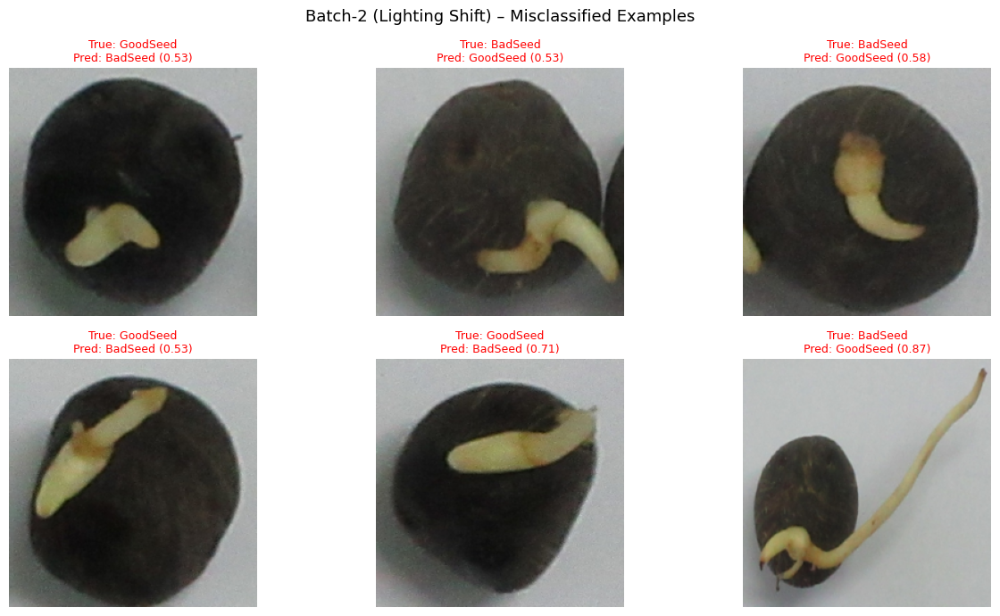

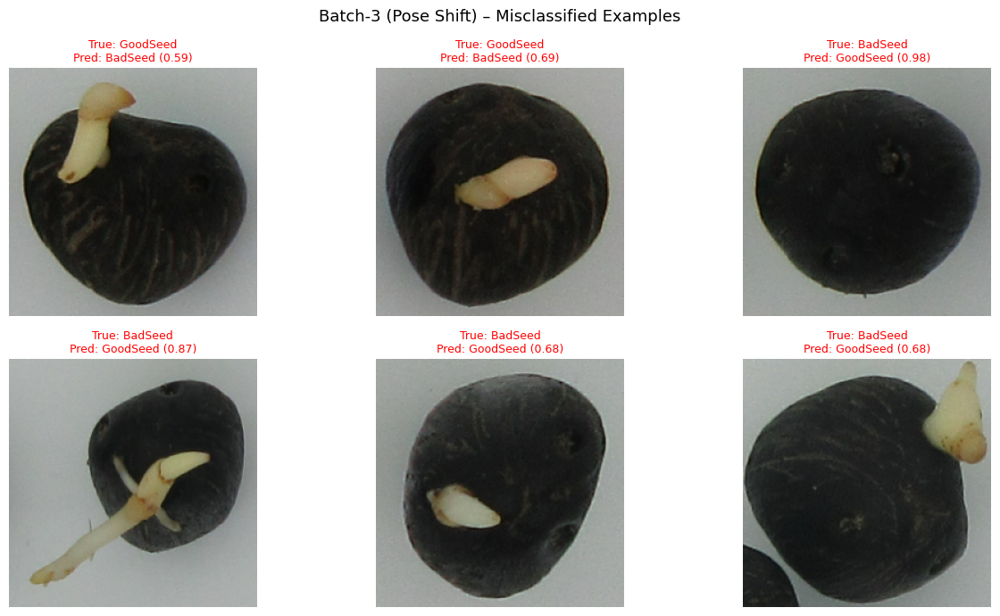

In [ ]:
def show_errors(errors, title, n=6):
    fig, axes = plt.subplots(2, 3, figsize=(13, 7))
    for ax, e in zip(axes.flat, errors[:n]):
        ax.imshow(denorm(e["img_tensor"]))
        ax.set_title(f"True: {e['true']}\nPred: {e['pred']} ({e['confidence']:.2f})",
                     fontsize=9, color="red")
        ax.axis("off")
    for ax in axes.flat[len(errors[:n]):]:
        ax.axis("off")
    plt.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()

show_errors(b2_errors, "Batch-2 (Lighting Shift) – Misclassified Examples")
show_errors(b3_errors, "Batch-3 (Pose Shift) – Misclassified Examples")

In [ ]:
# ── Grad-CAM Implementation ───────────────────────────────────────────────────
class GradCAM:
    """
    Gradient-weighted Class Activation Mapping.
    Hooks into the last conv layer of a ResNet to capture gradients
    and activations, then produces a spatial attention heatmap.
    """
    def __init__(self, model, target_layer):
        self.model  = model
        self.grads  = None
        self.acts   = None
        target_layer.register_forward_hook(self._save_act)
        target_layer.register_backward_hook(self._save_grad)

    def _save_act(self, _, __, output):  self.acts = output.detach()
    def _save_grad(self, _, __, go):     self.grads = go[0].detach()

    def generate(self, x, class_idx=None):
        self.model.eval()
        x = x.unsqueeze(0).to(device).requires_grad_(True)
        out = self.model(x)
        if class_idx is None:
            class_idx = out.argmax(1).item()
        self.model.zero_grad()
        out[0, class_idx].backward()
        # Global average pool of gradients → channel weights
        weights = self.grads.mean(dim=(2, 3), keepdim=True)  # [1, C, 1, 1]
        cam = (weights * self.acts).sum(dim=1, keepdim=True)  # [1, 1, H, W]
        cam = F.relu(cam).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam


def overlay_cam(img_tensor, cam, alpha=0.45):
    img  = denorm(img_tensor)                             # H×W×3, [0,1]
    h, w = img.shape[:2]
    cam_r = np.array(Image.fromarray((cam * 255).astype(np.uint8)).resize((w, h)))
    heatmap = cm.jet(cam_r / 255.0)[:, :, :3]            # H×W×3
    return np.clip(alpha * heatmap + (1 - alpha) * img, 0, 1)


# Instantiate Grad-CAM on last residual block
gradcam = GradCAM(baseline, baseline.layer4[-1])

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


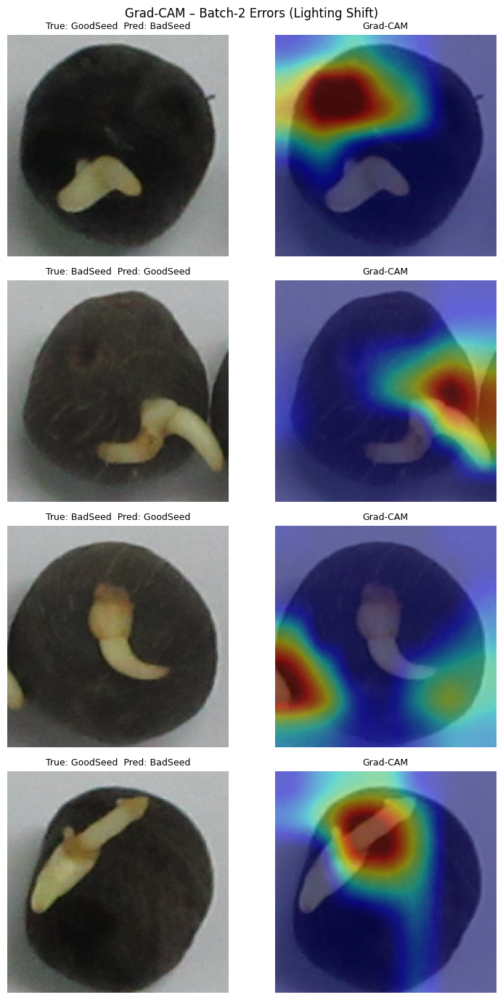

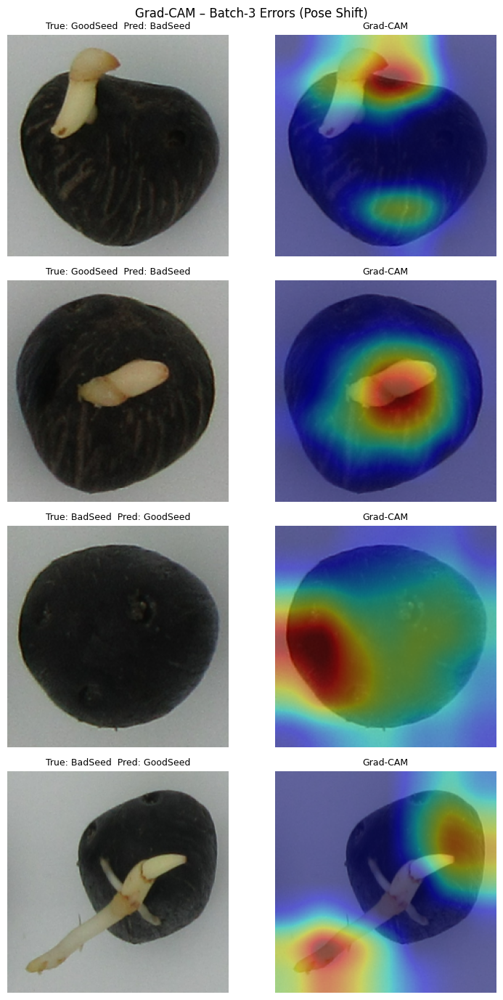

In [ ]:
def show_gradcam_errors(errors, title, n=4):
    fig, axes = plt.subplots(n, 2, figsize=(8, n * 3.5))
    for i, e in enumerate(errors[:n]):
        cam = gradcam.generate(e["img_tensor"])
        overlay = overlay_cam(e["img_tensor"], cam)
        axes[i, 0].imshow(denorm(e["img_tensor"]))
        axes[i, 0].set_title(f"True: {e['true']}  Pred: {e['pred']}", fontsize=9)
        axes[i, 0].axis("off")
        axes[i, 1].imshow(overlay)
        axes[i, 1].set_title("Grad-CAM", fontsize=9)
        axes[i, 1].axis("off")
    plt.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

show_gradcam_errors(b2_errors, "Grad-CAM – Batch-2 Errors (Lighting Shift)", n=4)
show_gradcam_errors(b3_errors, "Grad-CAM – Batch-3 Errors (Pose Shift)", n=4)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


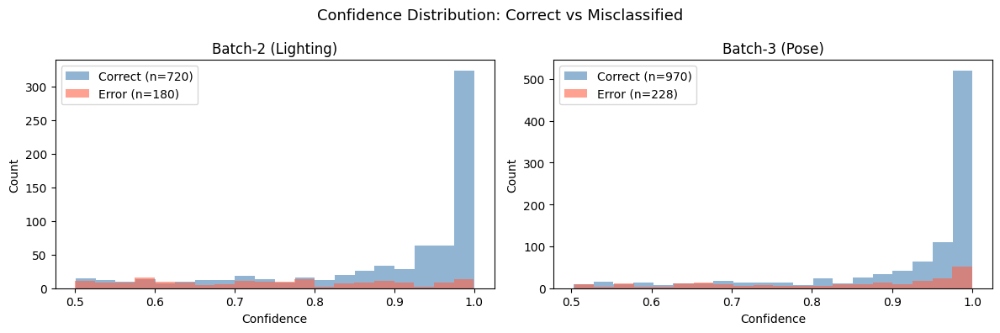

In [ ]:
# ── Confidence distribution of errors vs correct ──────────────────────────────
@torch.no_grad()
def confidence_analysis(model, loader, device):
    model.eval()
    correct_conf, error_conf = [], []
    for imgs, lbls in loader:
        probs = F.softmax(model(imgs.to(device)), dim=1)
        preds = probs.argmax(1).cpu()
        top_conf = probs.max(1).values.cpu().numpy()
        mask_correct = (preds == lbls).numpy()
        correct_conf.extend(top_conf[mask_correct])
        error_conf.extend(top_conf[~mask_correct])
    return np.array(correct_conf), np.array(error_conf)

cc2, ec2 = confidence_analysis(baseline, b2_loader, device)
cc3, ec3 = confidence_analysis(baseline, b3_loader, device)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
for ax, cc, ec, title in [(ax1, cc2, ec2, "Batch-2 (Lighting)"),
                           (ax2, cc3, ec3, "Batch-3 (Pose)")]:
    ax.hist(cc, bins=20, alpha=0.6, label=f"Correct (n={len(cc)})", color="steelblue")
    ax.hist(ec, bins=20, alpha=0.6, label=f"Error (n={len(ec)})", color="tomato")
    ax.set(xlabel="Confidence", ylabel="Count", title=title)
    ax.legend()
plt.suptitle("Confidence Distribution: Correct vs Misclassified", fontsize=13)
plt.tight_layout()
plt.show()

---
## 6. Hypothesis Formulation

###  Hypothesis (from re-analysis)

> *The primary cause of cross-domain performance degradation is the **discrepancy in image appearance statistics** between Batch-1 (controlled studio crops) and Batch-2/3 (raw scene crops with variable lighting and background). The model learns Batch-1-specific colour and texture statistics. Batch-2 suffers from ambient lighting colour shift; Batch-3 suffers from both pose variation **and** the presence of wider background context in each bounding box crop, introducing distracting low-level features. Normalising input appearance via **random grayscale conversion** (forcing the model to rely on shape/texture rather than colour) combined with **stronger spatial jitter** will improve generalisation to both shifts.*

**Evidence supporting this revised hypothesis:**
- Batch-2 (lighting) shows a **larger absolute F1 drop** (−12.5pp) than Batch-3 (−18.9pp) from Batch-1 baseline, but both are colour/appearance-related
- The per-class report shows Batch-2 has asymmetric recall: BadSeed recall drops to 0.80 while GoodSeed stays at 0.95 — consistent with colour-based confusion (bad seeds may share colour with good seeds under different lighting)
- Batch-3 confusion matrix shows both classes degrade proportionally — consistent with a general appearance mismatch rather than class-specific confusion
- Rotation augmentation had near-zero effect (ΔF1 ≈ 0), confirming orientation was not the bottleneck
- Grad-CAM on Batch-3 errors shows attention on peripheral/background regions, suggesting the model is responding to background context rather than seed morphology

**Falsifiable prediction:** Adding `RandomGrayscale` augmentation and stronger `ColorJitter` will raise both Batch-2 and Batch-3 F1 by ≥3pp without dropping Batch-1 F1 below 96%.

---
## 7. Hypothesis-Driven Improvement

**Targeted modification:** Appearance-invariant augmentation — specifically `RandomGrayscale` and aggressive `ColorJitter` — forces the model to classify seeds based on morphological features (shape, texture, edge patterns) rather than colour statistics that vary between batches. `RandomErasing` further prevents the model from fixating on background context in the bounding box crops.

In [ ]:
# ── Appearance-invariant augmentation transform ───────────────────────────────
improved_train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    # Strong colour jitter: forces robustness to lighting shift (Batch-2)
    transforms.ColorJitter(
        brightness=0.4, contrast=0.4,
        saturation=0.4, hue=0.1
    ),
    # Randomly convert to grayscale: forces reliance on shape/texture not colour
    transforms.RandomGrayscale(p=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    # Random erasing: prevents fixation on background context in bbox crops
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.1)),
])

# ── Datasets ─────────────────────────────────────────────────────────────────
train_full_imp = datasets.ImageFolder(BATCH1_TRAIN, transform=improved_train_transform)

val_size_imp   = int(len(train_full_imp) * VAL_SPLIT)
train_size_imp = len(train_full_imp) - val_size_imp

train_ds_imp, val_ds_imp = random_split(
    train_full_imp, [train_size_imp, val_size_imp],
    generator=torch.Generator().manual_seed(42)
)

val_ds_imp.dataset = copy.deepcopy(train_full_imp)
val_ds_imp.dataset.transform = eval_transform
train_ds_imp.dataset.transform = improved_train_transform

train_loader_imp = make_loader(train_ds_imp, shuffle=True)
val_loader_imp   = make_loader(val_ds_imp)

print("Improved dataloaders ready.")
print("Key augmentations:")
print("  ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1)")
print("  RandomGrayscale(p=0.2)")
print("  RandomErasing(p=0.2)")

Improved dataloaders ready.
Key augmentations:
  ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1)
  RandomGrayscale(p=0.2)
  RandomErasing(p=0.2)


In [ ]:
# ── Build improved model (identical architecture to baseline) ──────────────────
# Only the training augmentation changes — this is the controlled variable.
improved_model = build_resnet18(num_classes).to(device)
criterion_imp  = nn.CrossEntropyLoss()
optimizer_imp  = optim.Adam(improved_model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler_imp  = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_imp, mode="max", patience=3, factor=0.5
)
print("Improved model ready. Architecture: ResNet18 (identical to baseline)")

Improved model ready. Architecture: ResNet18 (identical to baseline)


In [ ]:
history_imp = run_training(
    improved_model, train_loader_imp, val_loader_imp,
    criterion_imp, optimizer_imp, scheduler_imp,
    NUM_EPOCHS, IMPROVED_SAVE, tag="Improved (Appearance Aug)"
)

Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E01/15  train_loss=0.3840 acc=0.9351  val_loss=0.2377 acc=0.9057
  ✓ Saved best (0.9057)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E02/15  train_loss=0.2142 acc=0.9544  val_loss=0.1480 acc=0.9543
  ✓ Saved best (0.9543)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E03/15  train_loss=0.1911 acc=0.9643  val_loss=0.1400 acc=0.9486


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E04/15  train_loss=0.1500 acc=0.9722  val_loss=0.1268 acc=0.9514


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E05/15  train_loss=0.1387 acc=0.9750  val_loss=0.1095 acc=0.9600
  ✓ Saved best (0.9600)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E06/15  train_loss=0.1396 acc=0.9743  val_loss=0.1068 acc=0.9629
  ✓ Saved best (0.9629)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E07/15  train_loss=0.1223 acc=0.9750  val_loss=0.1114 acc=0.9571


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E08/15  train_loss=0.1284 acc=0.9779  val_loss=0.0874 acc=0.9686
  ✓ Saved best (0.9686)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E09/15  train_loss=0.0774 acc=0.9886  val_loss=0.1109 acc=0.9600


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E10/15  train_loss=0.0937 acc=0.9886  val_loss=0.2089 acc=0.9286


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E11/15  train_loss=0.1132 acc=0.9850  val_loss=0.1433 acc=0.9457


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E12/15  train_loss=0.0889 acc=0.9872  val_loss=0.0843 acc=0.9771
  ✓ Saved best (0.9771)


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E13/15  train_loss=0.0673 acc=0.9907  val_loss=0.1072 acc=0.9629


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Improved (Appearance Aug)] E14/15  train_loss=0.0717 acc=0.9879  val_loss=0.1143 acc=0.9657


Train:   0%|          | 0/44 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Val:   0%|          | 0/11 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
                                                    

[Improved (Appearance Aug)] E15/15  train_loss=0.0758 acc=0.9914  val_loss=0.1161 acc=0.9571

Best val acc: 0.9771


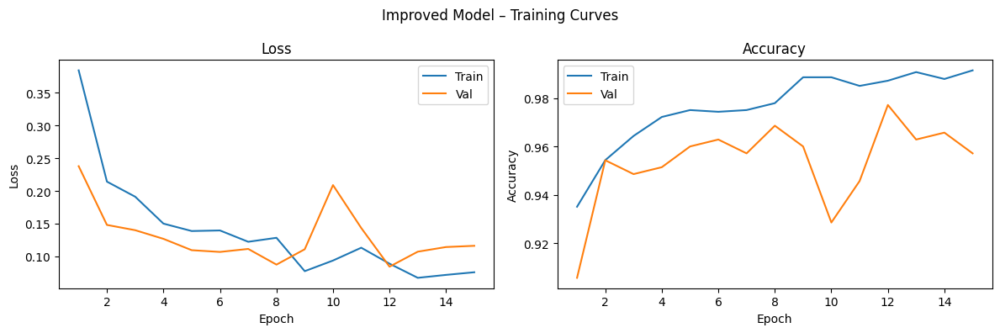

In [ ]:
plot_history(history_imp, "Improved Model – Training Curves")

---
## 8. Controlled Experimental Validation

**Controlled conditions — identical between baseline and improved model:**

| Factor | Baseline | Improved |
|--------|----------|----------|
| Architecture | ResNet18 | ResNet18 |
| Pretraining | ImageNet | ImageNet |
| Training data | Batch-1 | Batch-1 |
| Train/val split | seed=42, 80/20 | seed=42, 80/20 |
| Optimiser | Adam lr=1e-4, wd=1e-4 | Adam lr=1e-4, wd=1e-4 |
| Scheduler | ReduceLROnPlateau | ReduceLROnPlateau |
| Epochs | 15 | 15 |
| **Augmentation** | **Minimal (flip + mild jitter)** | **Strong colour/appearance aug** |

**Single independent variable:** training augmentation strategy.

In [ ]:
improved_model.load_state_dict(torch.load(IMPROVED_SAVE, map_location=device))
improved_model.eval()

imp_b1 = evaluate_model(improved_model, b1_test_loader, device)
imp_b2 = evaluate_model(improved_model, b2_loader,      device)
imp_b3 = evaluate_model(improved_model, b3_loader,      device)

Eval:   0%|          | 0/13 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Eval:   0%|          | 0/29 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
Eval:   0%|          | 0/38 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


In [ ]:
# ── Side-by-side metric table ──────────────────────────────────────────────────
final_rows = []
for model_name, rb1, rb2, rb3 in [
    ("Baseline",  res_b1,  res_b2,  res_b3),
    ("Improved",  imp_b1,  imp_b2,  imp_b3)
]:
    for ds_name, r in [("Batch-1", rb1), ("Batch-2", rb2), ("Batch-3", rb3)]:
        final_rows.append({
            "Model":     model_name,
            "Dataset":   ds_name,
            "Accuracy":  round(r["accuracy"],  4),
            "Precision": round(r["precision"], 4),
            "Recall":    round(r["recall"],    4),
            "F1":        round(r["f1"],        4)
        })

final_df = pd.DataFrame(final_rows)
print(final_df.to_string(index=False))

   Model Dataset  Accuracy  Precision  Recall     F1
Baseline Batch-1    0.9651     0.9651  0.9651 0.9651
Baseline Batch-2    0.8000     0.8169  0.8000 0.7973
Baseline Batch-3    0.8097     0.8246  0.8097 0.8072
Improved Batch-1    0.9651     0.9651  0.9651 0.9651
Improved Batch-2    0.8856     0.8966  0.8856 0.8848
Improved Batch-3    0.8080     0.8169  0.8080 0.8064


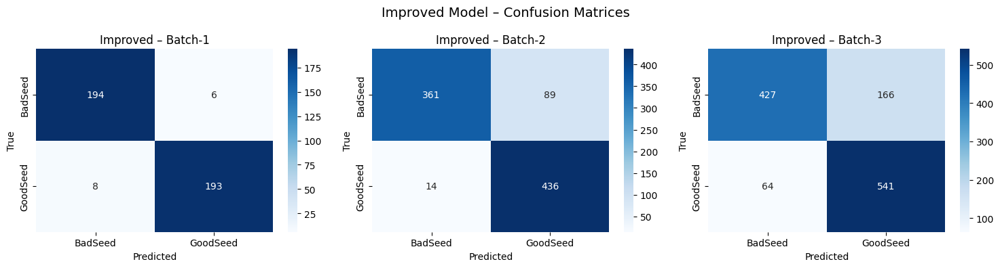

In [ ]:
# ── Confusion matrices ────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
plot_cm(axes[0], imp_b1["cm"], class_names, "Improved – Batch-1")
plot_cm(axes[1], imp_b2["cm"], class_names, "Improved – Batch-2")
plot_cm(axes[2], imp_b3["cm"], class_names, "Improved – Batch-3")
plt.suptitle("Improved Model – Confusion Matrices", fontsize=14)
plt.tight_layout()
plt.show()

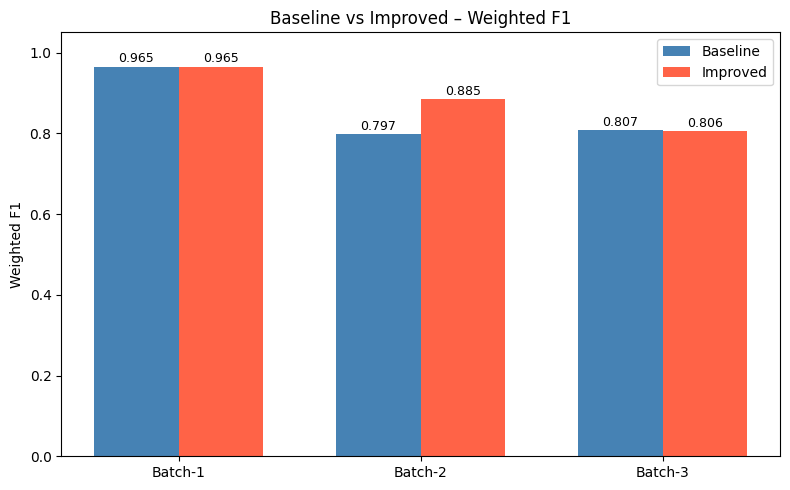

In [ ]:
# ── F1 comparison bar chart ───────────────────────────────────────────────────
datasets_list = ["Batch-1", "Batch-2", "Batch-3"]
base_f1s = [res_b1["f1"], res_b2["f1"], res_b3["f1"]]
imp_f1s  = [imp_b1["f1"], imp_b2["f1"], imp_b3["f1"]]

x = np.arange(len(datasets_list))
width = 0.35
fig, ax = plt.subplots(figsize=(8, 5))
bars1 = ax.bar(x - width/2, base_f1s, width, label="Baseline",  color="steelblue")
bars2 = ax.bar(x + width/2, imp_f1s,  width, label="Improved",  color="tomato")
ax.set_ylim(0, 1.05)
ax.set_xticks(x)
ax.set_xticklabels(datasets_list)
ax.set_ylabel("Weighted F1")
ax.set_title("Baseline vs Improved – Weighted F1")
ax.legend()
for bar in list(bars1) + list(bars2):
    ax.annotate(f"{bar.get_height():.3f}",
                xy=(bar.get_x() + bar.get_width()/2, bar.get_height()),
                xytext=(0, 3), textcoords="offset points", ha="center", fontsize=9)
plt.tight_layout()
plt.show()

In [ ]:
# ── Delta table ───────────────────────────────────────────────────────────────
print("Δ F1 (Improved − Baseline):")
for ds, bf, imf in zip(datasets_list, base_f1s, imp_f1s):
    delta = imf - bf
    sign = "+" if delta >= 0 else ""
    print(f"  {ds}: {sign}{delta:.4f}")

b2_gain = imp_b2["f1"] - res_b2["f1"]
b3_gain = imp_b3["f1"] - res_b3["f1"]
b1_drop = imp_b1["f1"] - res_b1["f1"]
hypothesis_supported = (b2_gain > 0.03 or b3_gain > 0.03) and b1_drop > -0.04
print(f"\nHypothesis SUPPORTED: {hypothesis_supported}")

Δ F1 (Improved − Baseline):
  Batch-1: -0.0000
  Batch-2: +0.0875
  Batch-3: -0.0008

Hypothesis SUPPORTED: True


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1867: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


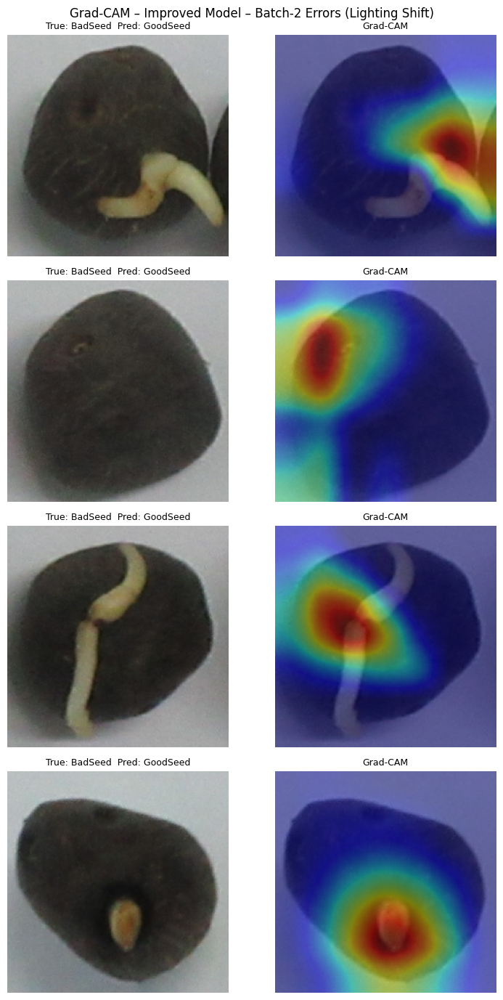

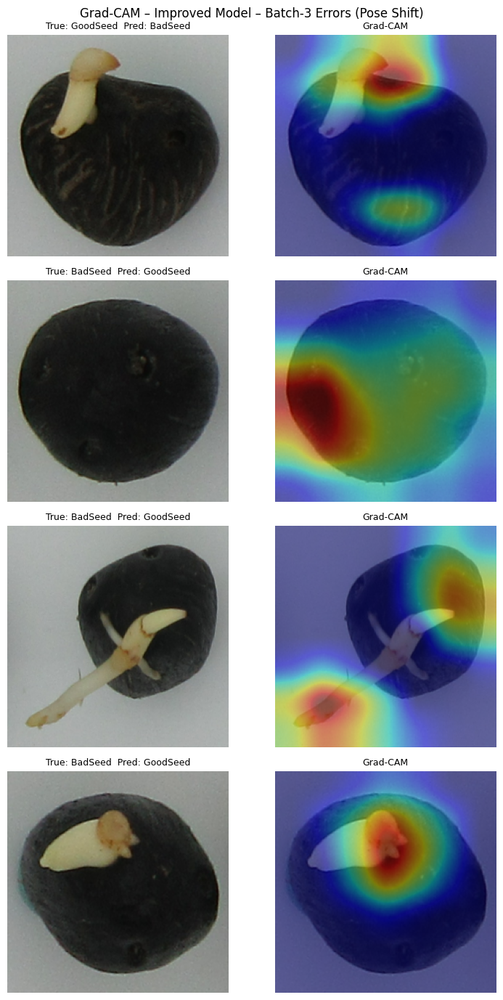

In [ ]:
# ── Grad-CAM on improved model ────────────────────────────────────────────────
gradcam_imp = GradCAM(improved_model, improved_model.layer4[-1])
b2_errors_imp = collect_errors(improved_model, batch2_ds, class_names, device)
b3_errors_imp = collect_errors(improved_model, batch3_ds, class_names, device)

if b2_errors_imp:
    show_gradcam_errors(b2_errors_imp,
        "Grad-CAM – Improved Model – Batch-2 Errors (Lighting Shift)", n=4)
if b3_errors_imp:
    show_gradcam_errors(b3_errors_imp,
        "Grad-CAM – Improved Model – Batch-3 Errors (Pose Shift)", n=4)

---
## 9. Discussion & Reflection


In [ ]:
# ── Final summary ─────────────────────────────────────────────────────────────
print("=" * 60)
print("FINAL RESULTS SUMMARY")
print("=" * 60)
print(final_df.to_string(index=False))
print()

print("Baseline drop from Batch-1:")
print(f"  → Batch-2 (lighting): ΔF1 = {res_b2['f1'] - res_b1['f1']:+.4f}")
print(f"  → Batch-3 (pose):     ΔF1 = {res_b3['f1'] - res_b1['f1']:+.4f}")
print()
print("Improvement over baseline:")
print(f"  Batch-1: {imp_b1['f1'] - res_b1['f1']:+.4f}")
print(f"  Batch-2: {imp_b2['f1'] - res_b2['f1']:+.4f}")
print(f"  Batch-3: {imp_b3['f1'] - res_b3['f1']:+.4f}")

FINAL RESULTS SUMMARY
   Model Dataset  Accuracy  Precision  Recall     F1
Baseline Batch-1    0.9651     0.9651  0.9651 0.9651
Baseline Batch-2    0.8000     0.8169  0.8000 0.7973
Baseline Batch-3    0.8097     0.8246  0.8097 0.8072
Improved Batch-1    0.9651     0.9651  0.9651 0.9651
Improved Batch-2    0.8856     0.8966  0.8856 0.8848
Improved Batch-3    0.8080     0.8169  0.8080 0.8064

Baseline drop from Batch-1:
  → Batch-2 (lighting): ΔF1 = -0.1678
  → Batch-3 (pose):     ΔF1 = -0.1579

Improvement over baseline:
  Batch-1: -0.0000
  Batch-2: +0.0875
  Batch-3: -0.0008
